In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sampling import sample_sphere, sample_ball
from helper import merge_domains_nd, update_neighbors, get_neighbors, dist_to_edge, get_average_heat, dist_to_obstacle
from shapes import EgoSphere
from path import filter_paths, check_path, check_intercept


VIEW_RANGE = 100
MOVEMENT_RANGE= 5
EPSILON = 0.4999999

In [2]:
def load_ndarray(name: str) -> np.ndarray:
    """Companion loader that reconstructs the array from the saved file."""
    with open(name, "r") as f:
        n     = int(f.readline().strip())
        shape = tuple(int(s) for s in f.readline().strip().split())
        flat  = list(map(float, f.readline().strip().split()))

    return np.array(flat).reshape(shape)

In [3]:
def wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, start, overall_domain, min_corner, curr_rec):
    if curr_rec == 1000:
        return 0, []
    adjusted_start = start-min_corner
    dist_g = np.linalg.norm(start-goal)
    if dist_g < radius_g:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    dist_b = dist_to_edge(adjusted_start, overall_domain)
    obstacle_hit = False
    dist_o = dist_to_obstacle(distance_field, min_corner_field, start)
    if dist_o == None:
        return 0, []
    if dist_o < dist_b:
        dist_b = dist_o
        obstacle_hit = True

    if obstacle_hit and dist_b < 5:
        return None, []
    
    if dist_b<EPSILON:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    point = None
    while point == None:
        v = sample_sphere(ego_sphere.dim, dist_b, start)
        point, next_steps = wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, v, overall_domain, min_corner, curr_rec+1)

    update_neighbors(overall_domain, adjusted_start, point)
    if point == 0:
        return 0, []
    next_steps.append(start)
    return point, next_steps

In [4]:
def WoS_altered_g(ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, overall_domain, min_corner):
    dim = len(start)
    max_heat = 0
    final_path = [start.copy()]
    radius_g = distance_field[tuple(np.round(goal-min_corner_field).astype(int))]
    for walk in range(n_walks):
        first_step = sample_ball(dim, radius, start)
        heat, path = wos_walk_altered_g(radius_g, ego_sphere,  distance_field, min_corner_field, goal, first_step, overall_domain, min_corner, 0)
        if len(path)>0:
            if heat > max_heat:
                max_heat = heat
                path.append(start)
                final_path = path
            elif heat == max_heat:
                if len(path) < len(final_path):
                    max_heat = heat
                    path.append(start)
                    final_path = path
                
    return overall_domain, final_path

In [5]:
def ego_centric_wos_mapping(path, domain, min_corner, start, goal, distance_field, min_corner_field, direction, n_walks=1000):
    ego_sphere = EgoSphere(VIEW_RANGE, start, goal)
    radius = min(VIEW_RANGE, dist_to_obstacle(distance_field, min_corner_field, start))
    domain, new_path = WoS_altered_g(ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, domain, min_corner)
    
    if len(new_path)>1 and check_path(path, new_path, domain, min_corner):
        new_path = filter_paths(new_path, distance_field, min_corner_field, domain, min_corner)
        path = new_path

    if len(path) < 2:
        return domain, path[0], path
    if len(path) < 3:
        path[0] = path[0] + (path[1] - path[0])/2
        return domain, path[0], path
    
    return domain, path[1], path[1:]



In [6]:
def path_mapping(start, goal, distance_field, min_corner_field, direction=None, n_walks=1000):
    dim = len(start)
    dist_g = np.ceil(np.linalg.norm(start-goal)).astype(int)
    path = [start.copy()]
    krr = [start.copy()]
    heatmaps = []
    domain = np.zeros(shape=[1]*dim)
    min_corner = start
    min_corners = []
    domain_size = VIEW_RANGE * 2 + 1
    count = 0

    while dist_g>distance_field[tuple(np.round(goal-min_corner_field).astype(int))]:
        print(start)
        count+=1
        new_min_corner = start - np.array([VIEW_RANGE]*dim)
        domain, min_corner = merge_domains_nd(domain, min_corner, new_min_corner, tuple([domain_size]*dim))

        solved_domain, start, krr = ego_centric_wos_mapping(krr, domain, min_corner, start, goal, distance_field, min_corner_field, direction, n_walks)
        path.append(start.copy())
        dist_g = np.linalg.norm(start-goal)
        if count%1 == 0:
            temp = np.array(path)
            hi = np.array(krr)
            #plot_heatmap_3d(solved_domain, temp-min_corner)
            plt.imshow(solved_domain, cmap='inferno')
            plt.plot(*(temp-min_corner).T[::-1], 'w-')
            plt.show()
            print(start)
        '''threshold = np.quantile(solved_domain, 0.999)
        mask = solved_domain >= threshold
        points = solved_domain.copy()
        points[mask] = 0
        plt.imshow(solved_domain, cmap='inferno')
        plt.plot(*(temp-min_corner).T[::-1], 'w-')
        plt.show()'''
        
        heatmaps.append(solved_domain)
        min_corners.append(min_corner)

    #path.append(goal)

    return heatmaps, path, min_corners


In [7]:
#working with velocity
def WoS_altered_g(velocity, ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, overall_domain, min_corner):
    dim = len(start)
    max_heat = 0
    final_path = [start.copy()]
    radius_g = distance_field[tuple(np.round(goal-min_corner_field).astype(int))]
    heat_sources = heat_velcoity_map(start,)
    for walk in range(n_walks):
        first_step = sample_ball(dim, radius, start)
        heat, path = wos_walk_altered_g(velocity, radius_g, ego_sphere,  distance_field, min_corner_field, goal, first_step, overall_domain, min_corner, 0)
        if len(path)>0:
            if heat > max_heat:
                max_heat = heat
                path.append(start)
                final_path = path
            elif heat == max_heat:
                if len(path) < len(final_path):
                    max_heat = heat
                    path.append(start)
                    final_path = path
                
    return overall_domain, final_path

def wos_walk_altered_g(velocity, radius_g, ego_sphere, distance_field, min_corner_field, goal, start, overall_domain, min_corner, curr_rec):
    if curr_rec == 1000:
        return 0, []
    adjusted_start = start-min_corner
    dist_g = np.linalg.norm(start-goal)
    if dist_g < radius_g:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    dist_b = dist_to_edge(adjusted_start, overall_domain)
    obstacle_hit = False
    dist_o = get_neighbors(distance_field, start-min_corner_field)
    if len(dist_o)>0:
        for i in dist_o:
            if i[1] <= dist_b:
                dist_b = i[1]
                obstacle_hit = True
    else:
        return 0,[]

    if obstacle_hit and dist_b < 5:
        return None, []
    
    if dist_b<EPSILON:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    point = None
    while point == None:
        v = sample_sphere(ego_sphere.dim, dist_b, start)
        point, next_steps = wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, v, overall_domain, min_corner, curr_rec+1)

    if 

    update_neighbors(overall_domain, adjusted_start, point)
    if point == 0:
        return 0, []
    next_steps.append(start)
    return point, next_steps

SyntaxError: invalid syntax (524664648.py, line 58)

In [8]:
start = np.array([750.0, 50.0])
goal = np.array([250.0, 950.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/forest_2d')
min_corner_field = np.array([0,0])
direction = np.array([0, -1])

In [ ]:
start = np.array([250.0, 450.0])
goal = np.array([250.0, 800.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/box_2d')
min_corner_field = np.array([0,250])
direction = np.array([0, -1])

In [ ]:
start = np.array([450, 400.0, 450.0])
goal = np.array([450, 540.0, 450.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/obstacles_3d')
min_corner_field = np.array([350,350,350])
direction = np.array([0, -1])

In [ ]:
start = np.array([450, 400.0])
goal = np.array([450, 540.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/obstacles_2d')
min_corner_field = np.array([350,350])
direction = np.array([0, -1])

[750.  50.]


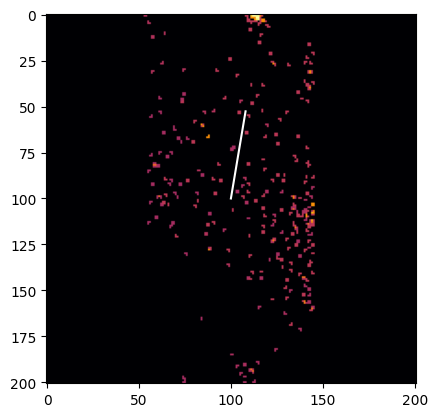

[702.60268845  57.96975681]
[702.60268845  57.96975681]


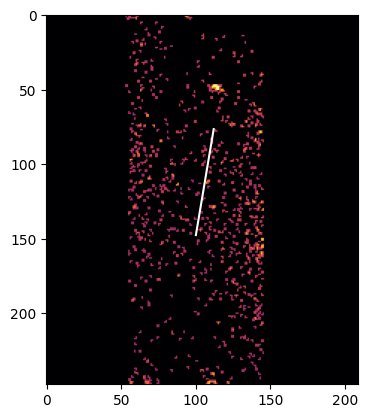

[678.90403267  61.95463521]
[678.90403267  61.95463521]


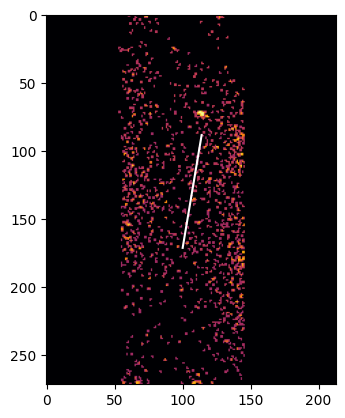

[667.05470478  63.94707441]
[667.05470478  63.94707441]


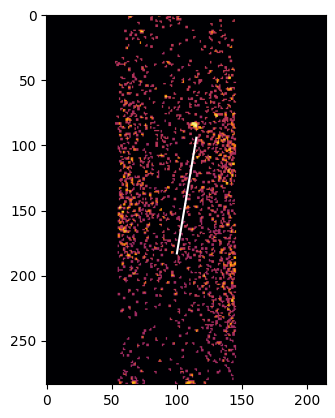

[661.13004084  64.94329401]
[661.13004084  64.94329401]


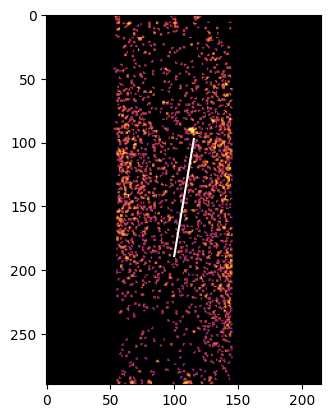

[658.16770886  65.44140381]
[658.16770886  65.44140381]


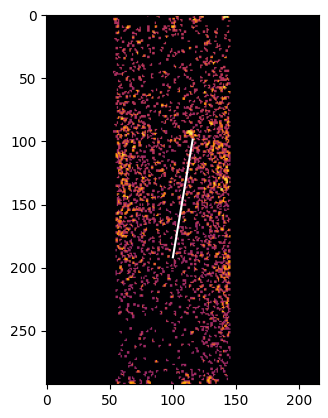

[656.68654288  65.69045871]
[656.68654288  65.69045871]


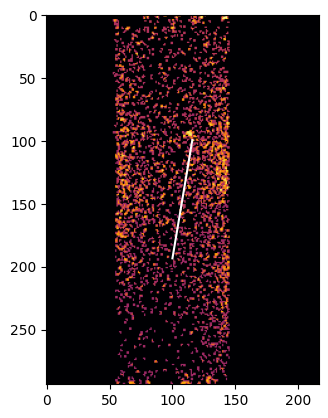

[655.94595988  65.81498616]
[655.94595988  65.81498616]


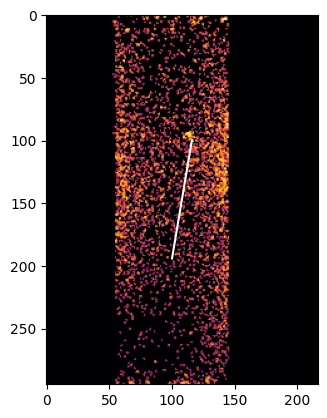

[655.57566839  65.87724989]
[655.57566839  65.87724989]


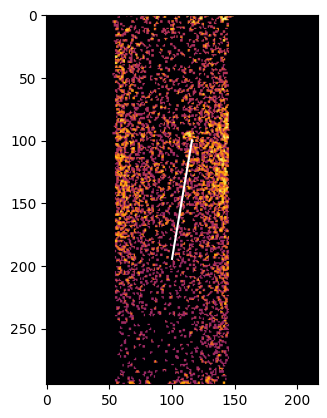

[655.39052264  65.90838175]
[655.39052264  65.90838175]


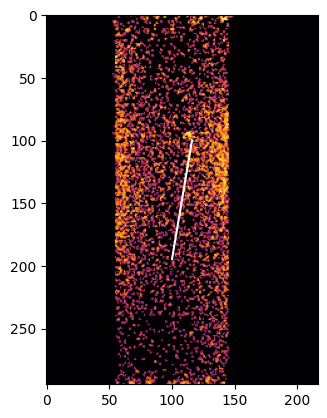

[655.29794977  65.92394768]
[655.29794977  65.92394768]


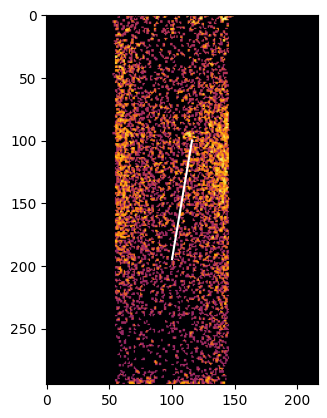

[655.25166333  65.93173065]
[655.25166333  65.93173065]


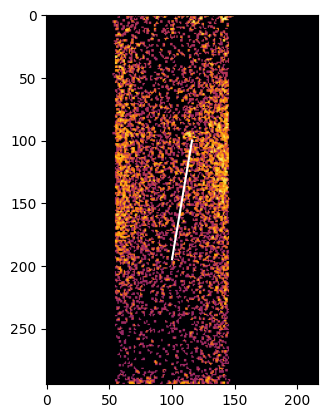

[655.22852011  65.93562213]
[655.22852011  65.93562213]


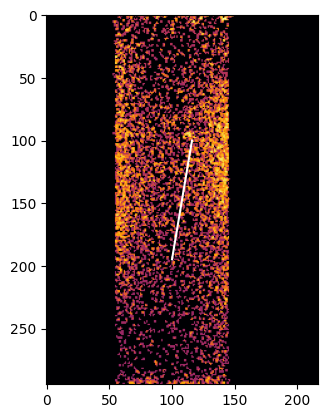

[655.2169485   65.93756787]
[655.2169485   65.93756787]


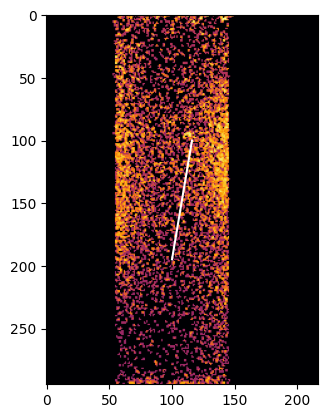

[655.2111627   65.93854074]
[655.2111627   65.93854074]


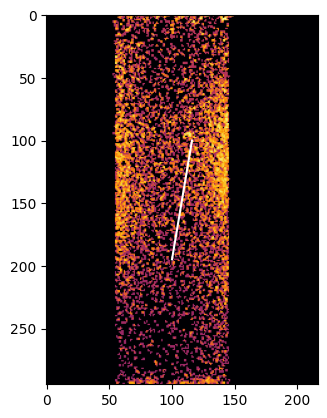

[655.20826979  65.93902718]
[655.20826979  65.93902718]


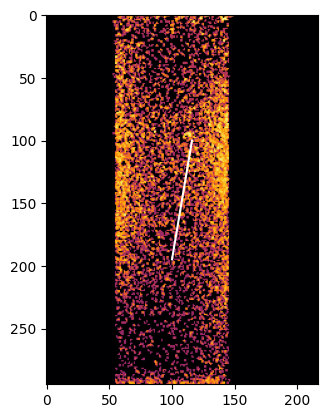

[655.20682334  65.9392704 ]
[655.20682334  65.9392704 ]


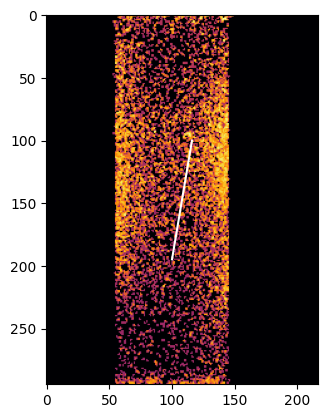

[655.20610012  65.939392  ]
[655.20610012  65.939392  ]


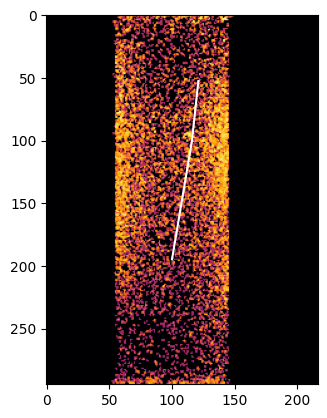

[607.69438854  71.02151045]
[607.69438854  71.02151045]


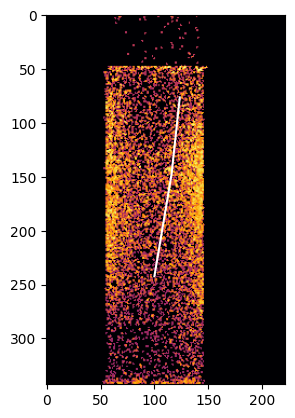

[583.93853274  73.56256967]
[583.93853274  73.56256967]


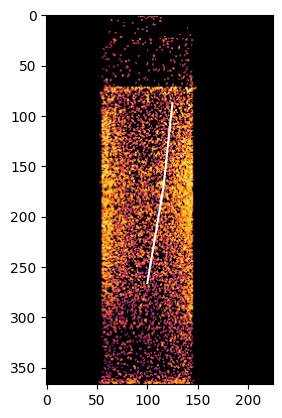

[572.06060485  74.83309928]
[572.06060485  74.83309928]


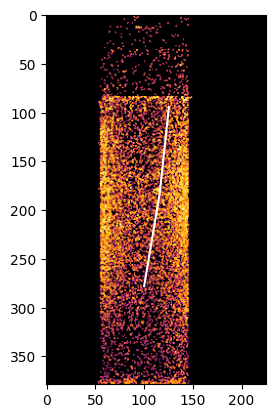

[566.1216409   75.46836408]
[566.1216409   75.46836408]


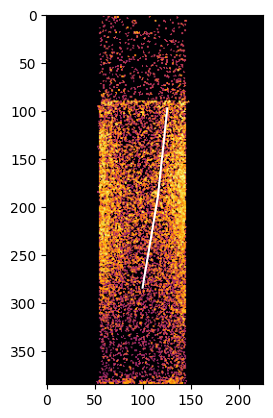

[563.15215893  75.78599648]
[563.15215893  75.78599648]


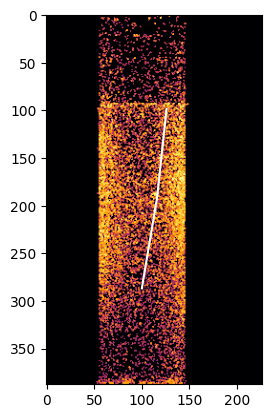

[561.66741794  75.94481269]
[561.66741794  75.94481269]


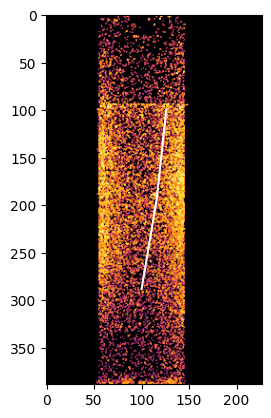

[560.92504745  76.02422079]
[560.92504745  76.02422079]


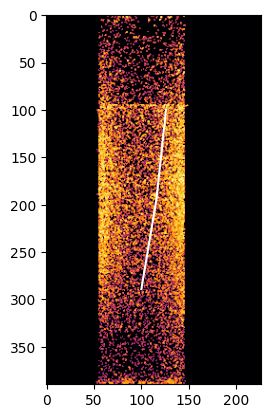

[560.5538622   76.06392484]
[560.5538622   76.06392484]


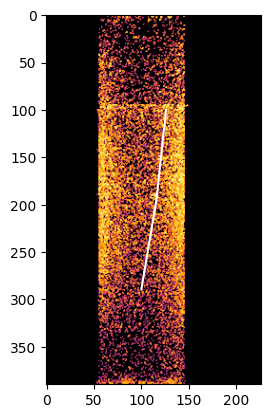

[560.36826958  76.08377686]
[560.36826958  76.08377686]


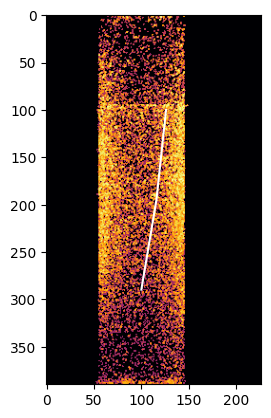

[560.27547326  76.09370287]
[560.27547326  76.09370287]


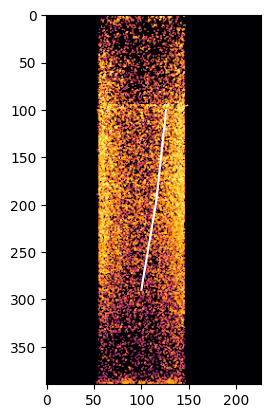

[560.22907511  76.09866588]
[560.22907511  76.09866588]


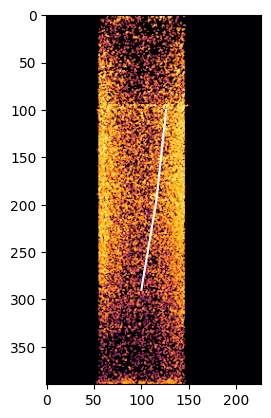

[560.20587603  76.10114738]
[560.20587603  76.10114738]


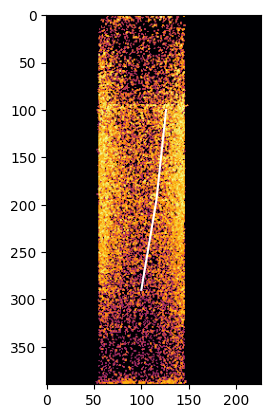

[560.19427649  76.10238814]
[560.19427649  76.10238814]


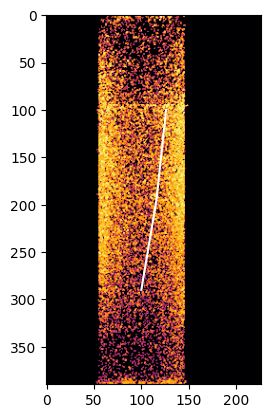

[560.18847672  76.10300851]
[560.18847672  76.10300851]


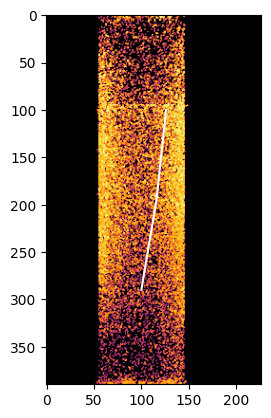

[560.18557684  76.1033187 ]
[560.18557684  76.1033187 ]


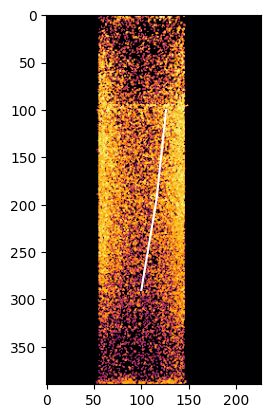

[560.1841269   76.10347379]
[560.1841269   76.10347379]


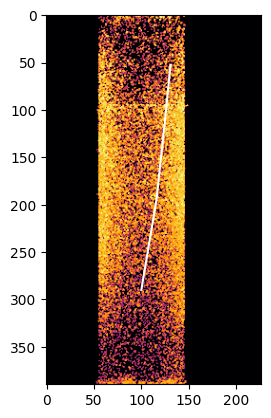

[512.81355884  80.74980472]
[512.81355884  80.74980472]


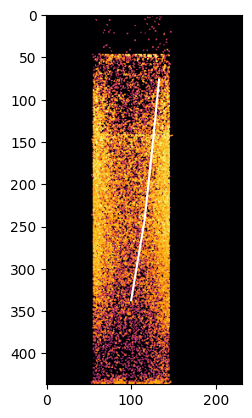

[489.12827482  83.07297019]
[489.12827482  83.07297019]


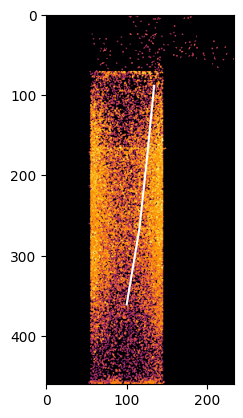

[477.2856328   84.23455292]
[477.2856328   84.23455292]


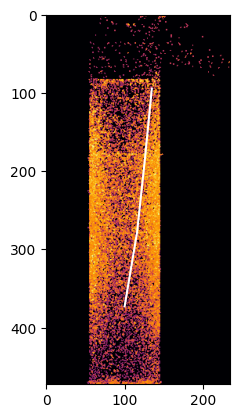

[471.3643118   84.81534429]
[471.3643118   84.81534429]


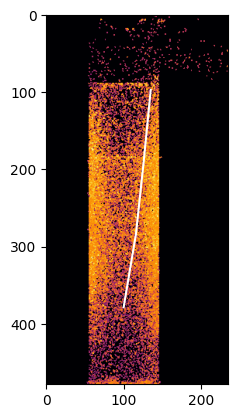

[468.40365129  85.10573997]
[468.40365129  85.10573997]


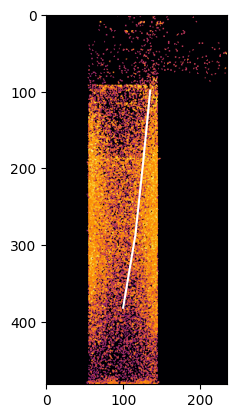

[466.92332104  85.25093781]
[466.92332104  85.25093781]


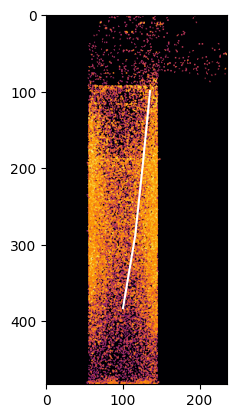

[466.18315592  85.32353673]
[466.18315592  85.32353673]


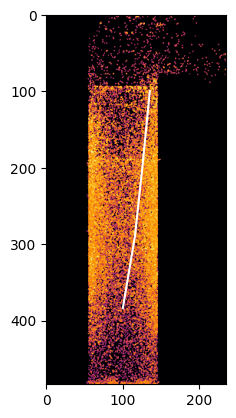

[465.81307335  85.35983619]
[465.81307335  85.35983619]


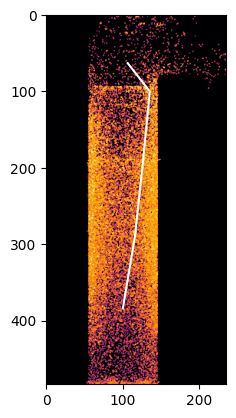

[428.80074243  56.33056932]
[428.80074243  56.33056932]


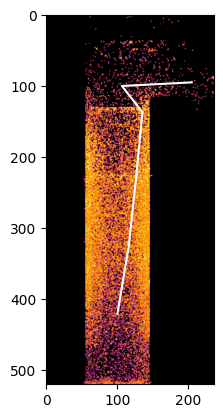

[423.72653377 154.7339304 ]
[423.72653377 154.7339304 ]


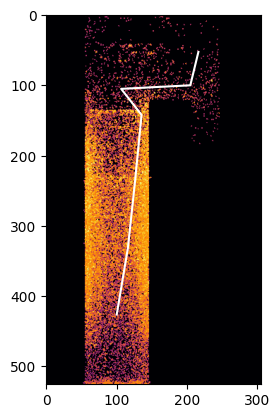

[376.27280138 166.23077611]
[376.27280138 166.23077611]


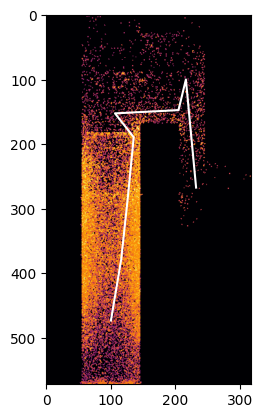

[543.84820982 182.0474912 ]
[543.84820982 182.0474912 ]


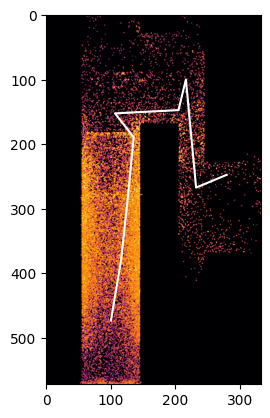

[524.02362685 229.5257284 ]
[524.02362685 229.5257284 ]


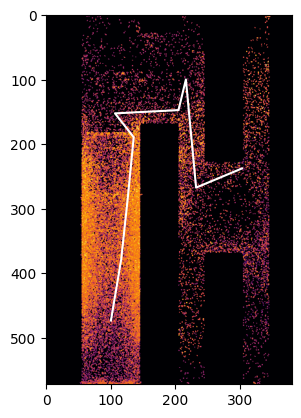

[514.11133536 253.264847  ]
[514.11133536 253.264847  ]


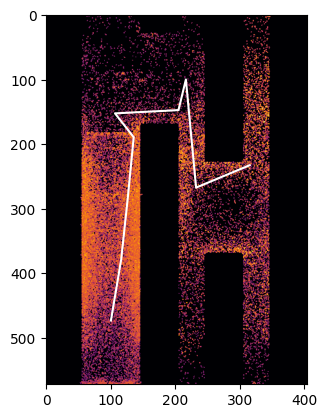

[509.15518962 265.1344063 ]
[509.15518962 265.1344063 ]


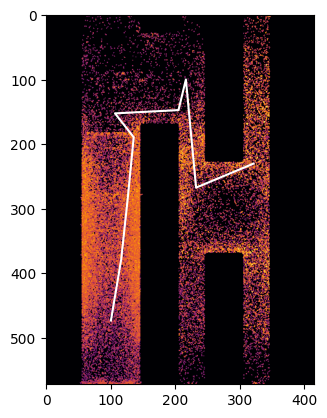

[506.67711675 271.06918595]
[506.67711675 271.06918595]


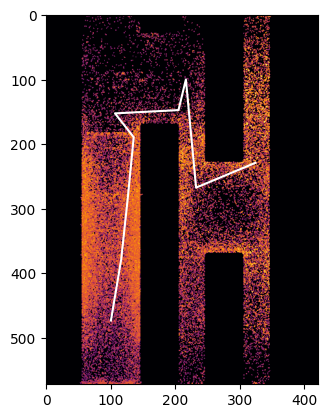

[505.43808031 274.03657577]
[505.43808031 274.03657577]


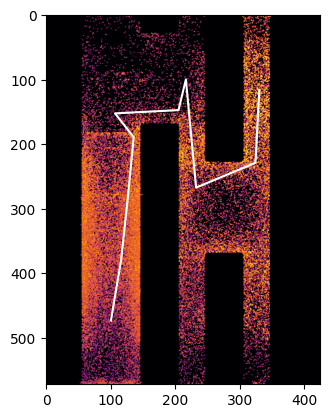

[393.38665076 280.06275276]
[393.38665076 280.06275276]


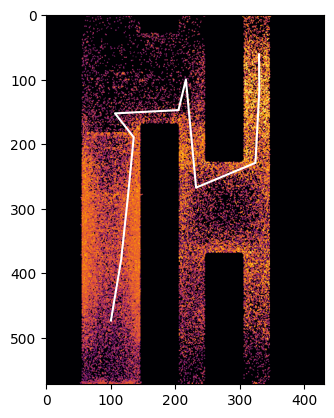

[337.34376988 279.59488852]
[337.34376988 279.59488852]


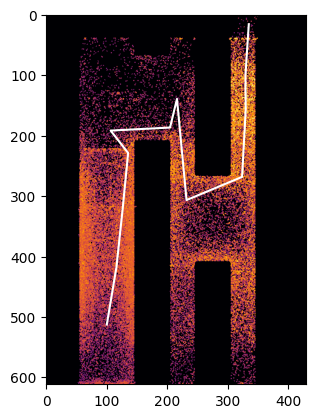

[252.64193802 285.13388944]
[252.64193802 285.13388944]


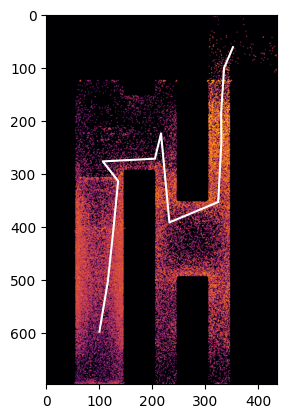

[213.46551878 301.89618555]
[213.46551878 301.89618555]


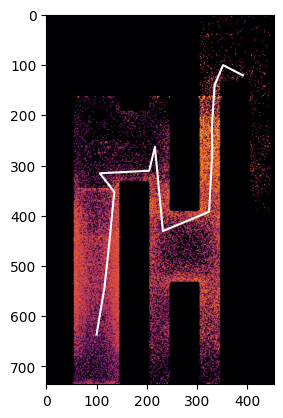

[233.64934769 341.19648914]
[233.64934769 341.19648914]


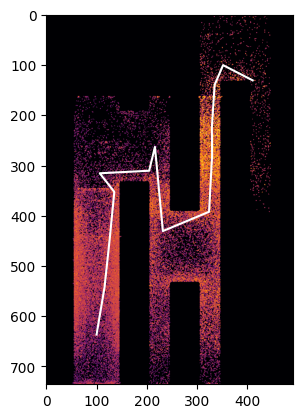

[243.74126214 360.84664093]
[243.74126214 360.84664093]


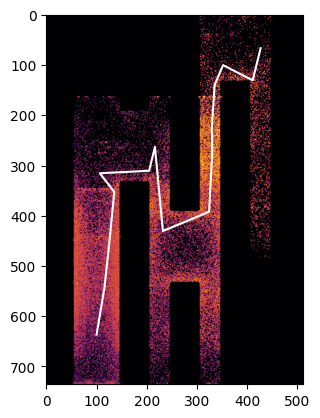

[179.74791586 376.68984829]
[179.74791586 376.68984829]


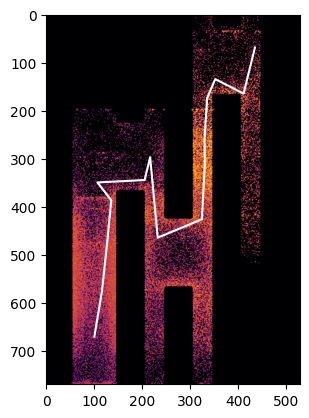

[147.75124273 384.61145196]
[147.75124273 384.61145196]


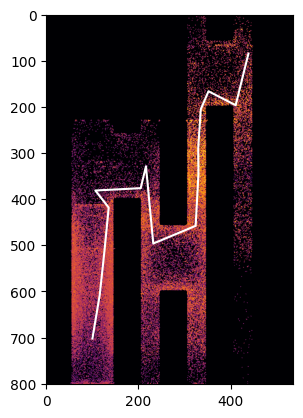

[131.75290616 388.5722538 ]
[131.75290616 388.5722538 ]


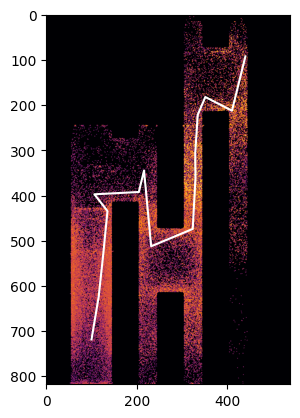

[123.75373787 390.55265472]
[123.75373787 390.55265472]


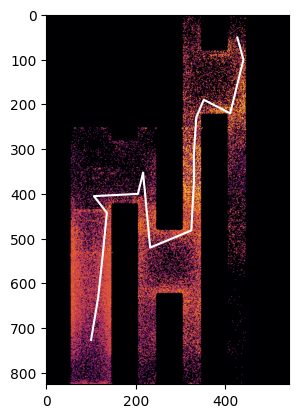

[ 74.20364885 376.84909079]
[ 74.20364885 376.84909079]


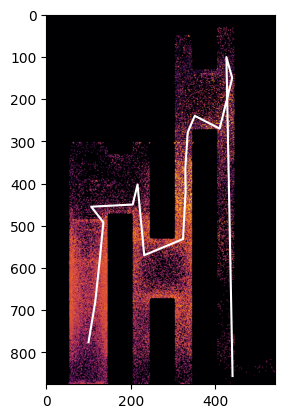

[830.15381045 391.44340138]
[830.15381045 391.44340138]


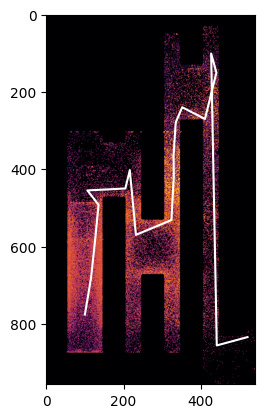

[808.51882473 471.01800526]
[808.51882473 471.01800526]


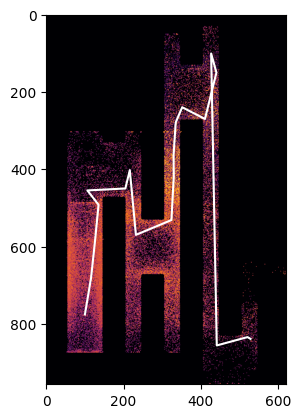

[813.18288274 478.86027915]
[813.18288274 478.86027915]


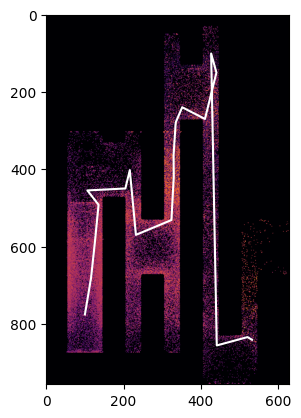

[815.51491175 482.78141609]
[815.51491175 482.78141609]


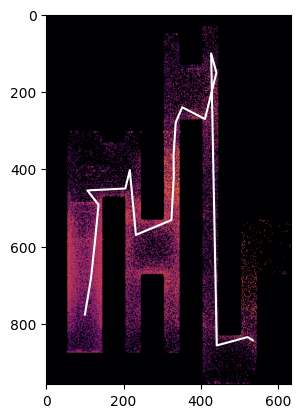

[816.68092625 484.74198456]
[816.68092625 484.74198456]


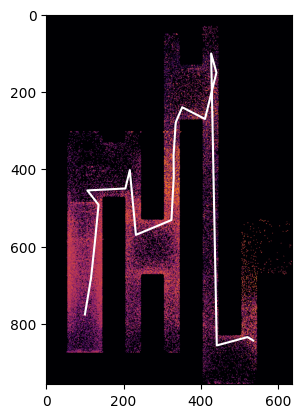

[817.2639335  485.72226879]
[817.2639335  485.72226879]


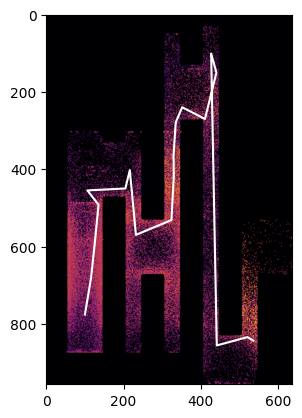

[817.55543713 486.21241091]
[817.55543713 486.21241091]


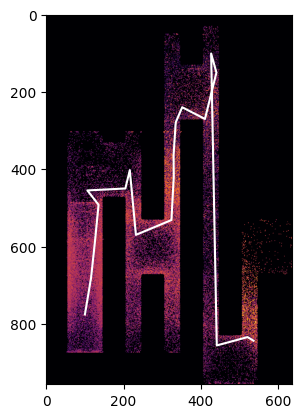

[817.70118894 486.45748197]
[817.70118894 486.45748197]


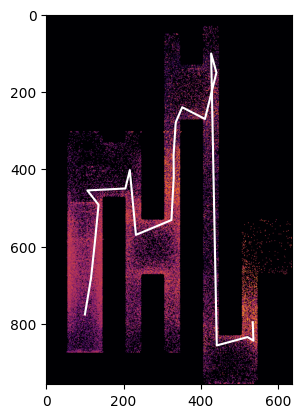

[770.06933026 484.50974457]
[770.06933026 484.50974457]


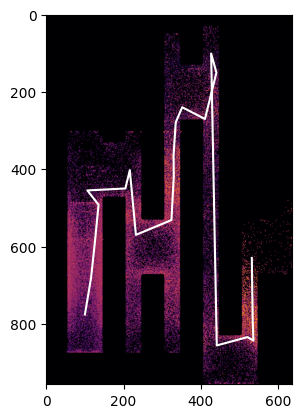

[603.49718662 482.14673405]
[603.49718662 482.14673405]


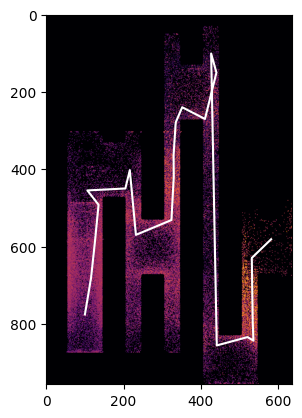

[555.19622626 532.15153031]
[555.19622626 532.15153031]


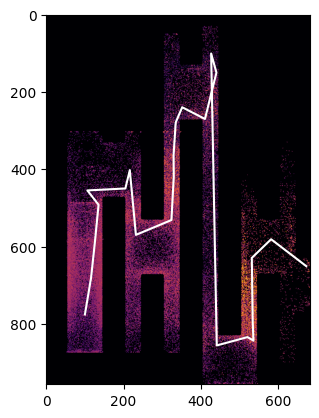

[624.80120335 623.12918362]
[624.80120335 623.12918362]


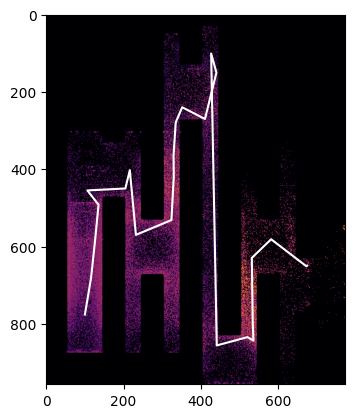

[623.56276393 625.37340609]
[623.56276393 625.37340609]


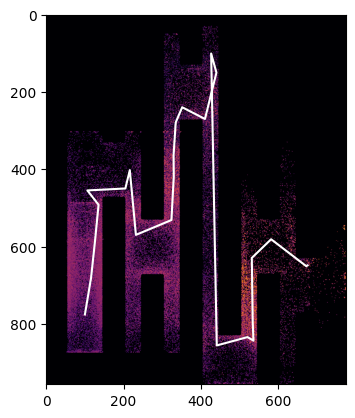

[622.94354422 626.49551732]
[622.94354422 626.49551732]


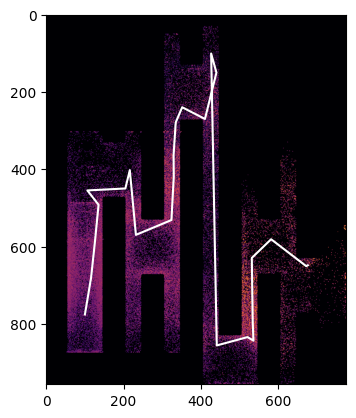

[622.63393437 627.05657294]
[622.63393437 627.05657294]


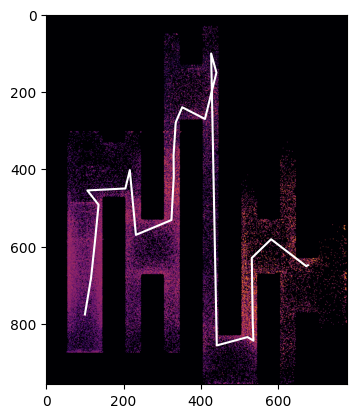

[622.47912944 627.33710075]
[622.47912944 627.33710075]


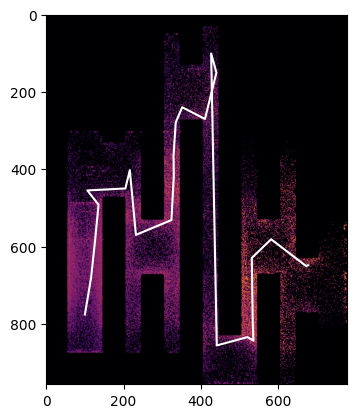

[622.40172697 627.47736466]
[622.40172697 627.47736466]


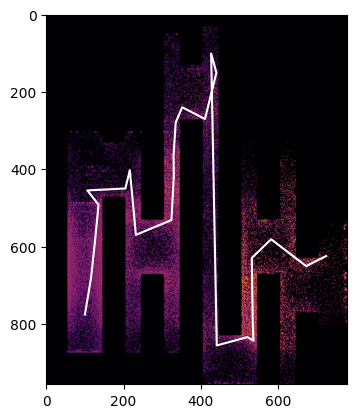

[598.55208253 674.81772105]
[598.55208253 674.81772105]


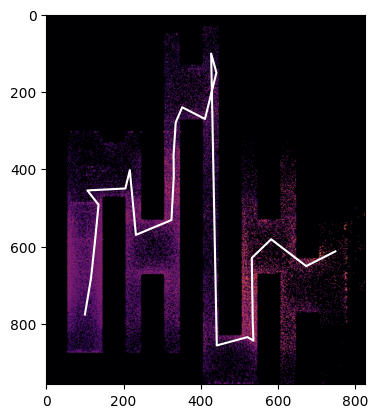

[586.62726031 698.48789924]
[586.62726031 698.48789924]


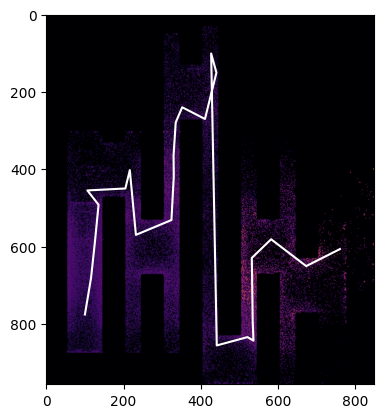

[580.6648492  710.32298834]
[580.6648492  710.32298834]


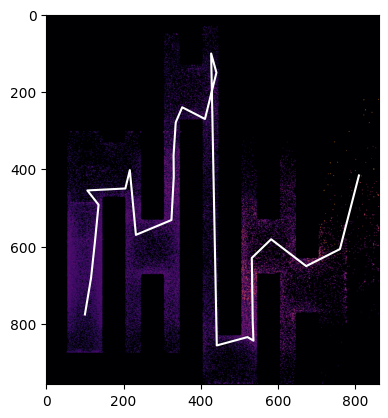

[389.96153445 759.52083515]
[389.96153445 759.52083515]


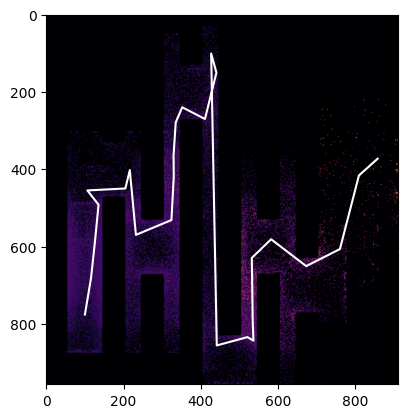

[346.69439852 807.89378997]
[346.69439852 807.89378997]


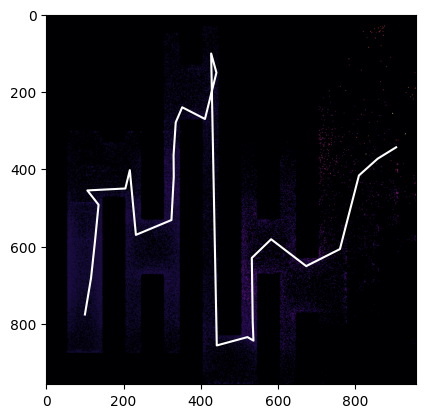

[317.10562733 855.8071519 ]
[317.10562733 855.8071519 ]


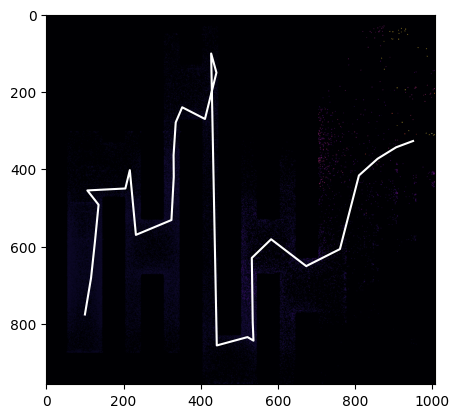

[300.76106383 899.66623971]
[300.76106383 899.66623971]


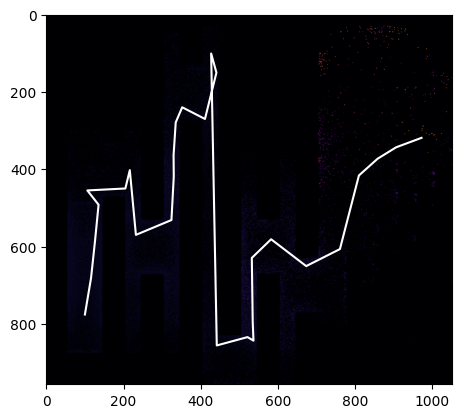

[292.58878208 921.59578361]
[292.58878208 921.59578361]


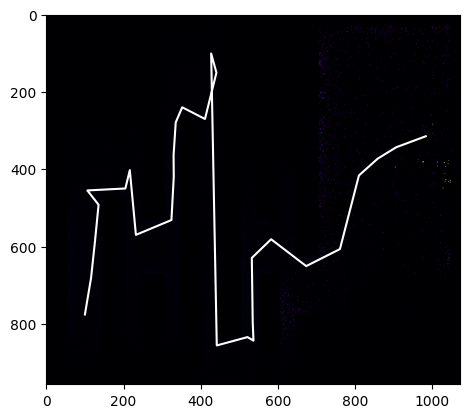

[288.5026412  932.56055556]


In [9]:
heatmaps, paths, min_corners = path_mapping(start, goal, distance_field, min_corner_field, n_walks=10)

Rendering: 88it [00:18,  4.64it/s]                        


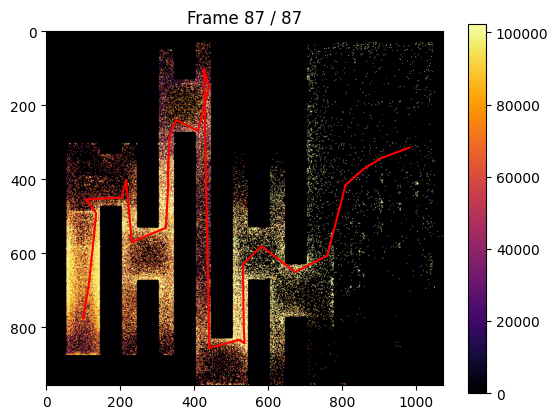

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from tqdm import tqdm

fig, ax = plt.subplots()

# Initialise image with the final merged shape so the axes are sized correctly
# from the start — this prevents imshow from locking in a stale extent on frame 0.
initial_hi, _ = merge_domains_nd(
    heatmaps[0], min_corners[0], min_corners[-1], heatmaps[-1].shape
)

im = ax.imshow(
    initial_hi,
    cmap='inferno',
    animated=True,
    extent=[0, initial_hi.shape[1], initial_hi.shape[0], 0],  # [l, r, b, t]
    origin='upper',
)
plt.colorbar(im, ax=ax)

line_object = ax.plot([], [], 'r-')[0]
pbar = tqdm(total=len(heatmaps), desc='Rendering')


def update(frame):
    hi, bye = merge_domains_nd(
        heatmaps[frame], min_corners[frame], min_corners[-1], heatmaps[-1].shape
    )

    # --- image ---
    im.set_data(hi)

    # Update the extent so every pixel in `hi` maps to exactly 1 data unit.
    # Without this the image is stretched/squashed whenever the merged shape grows.
    im.set_extent([0, hi.shape[1], hi.shape[0], 0])  # [left, right, bottom, top]

    # Keep axes limits in sync with the (possibly growing) image.
    ax.set_xlim(0, hi.shape[1])
    ax.set_ylim(hi.shape[0], 0)   # inverted: row 0 at top, matching origin='upper'

    ax.set_title(f'Frame {frame + 1} / {len(heatmaps)}')

    # --- path ---
    # Shift path coordinates into the merged array's local frame.
    # `bye` must be [row, col] order to match `paths`.
    path = np.array(paths[: frame + 2]).copy() - bye

    # imshow convention: x-axis = columns, y-axis = rows
    line_object.set_data(path[:, 1], path[:, 0])

    pbar.update(1)
    return [im, line_object]


ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(heatmaps),
    interval=500,
    blit=False,
)

ani.save('smth.gif', writer='pillow', fps=10)
pbar.close()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
from tqdm import tqdm


def animate_heatmap_3d(
    heatmaps: list[np.ndarray],
    min_corners: list,
    paths: list,
    clip_percentile: float = 100,
    max_alpha: float = 0.3,
    threshold: float = 0.1,
    interval: int = 500,
    fps: int = 10,
    output_path: str = "forest_3d.gif",
):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    max_shape = heatmaps[-1].shape

    def _set_axes():
        ax.set_xlim(0, max_shape[0])
        ax.set_ylim(0, max_shape[1])
        ax.set_zlim(0, max_shape[2])
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
    # --- helper: build scatter inputs for one frame ---
    def _prepare_frame(frame: int):
        hi, bye = merge_domains_nd(
            heatmaps[frame], min_corners[frame], min_corners[-1], heatmaps[-1].shape
        )

        data = np.clip(hi, 0, np.percentile(hi, clip_percentile))
        norm = (data - data.min()) / (data.max() - data.min() + 1e-8)

        n = data.shape
        x, y, z = np.meshgrid(np.arange(n[0]), np.arange(n[1]), np.arange(n[2]), indexing="ij")

        v = norm.flatten()
        mask = v > threshold

        colors = cm.plasma(v[mask])
        colors[:, 3] = v[mask] * max_alpha

        xs = x.flatten()[mask]
        ys = y.flatten()[mask]
        zs = z.flatten()[mask]

        # shift path into the merged frame (same logic as your 2D version)
        path = np.array(paths[: frame + 1]).copy() - bye  # shape (N, 3)

        return xs, ys, zs, colors, path.T, data.min(), data.max()

    # --- seed frame 0 so axes are sized correctly from the start ---
    xs, ys, zs, colors, path, vmin, vmax = _prepare_frame(0)

    scatter = ax.scatter(xs, ys, zs, c=colors, marker="s", s=30, linewidths=0)
    (line,) = ax.plot(*path, color="red", linewidth=1.5)

    _set_axes()
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")

    pbar = tqdm(total=len(heatmaps), desc="Rendering")

    def update(frame: int):
        ax.cla()  # 3-D scatter has no set_offsets3d that also updates colours,
                  # so clearing and redrawing is the cleanest approach

        xs, ys, zs, colors, path, vmin, vmax = _prepare_frame(frame)
        
        ax.scatter(xs, ys, zs, c=colors, marker="s", s=30, linewidths=0)
        ax.plot(*path, color="red", linewidth=1.5)
        _set_axes()  # restore limits after cla()
        ax.set_title(f"Frame {frame + 1} / {len(heatmaps)}")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")

        pbar.update(1)
        return []   # blit=False, so return value is ignored

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=len(heatmaps),
        interval=interval,
        blit=False,
    )

    ani.save(output_path, writer="pillow", fps=fps)
    pbar.close()
    plt.show()

Rendering: 15it [00:13,  1.08it/s]                        


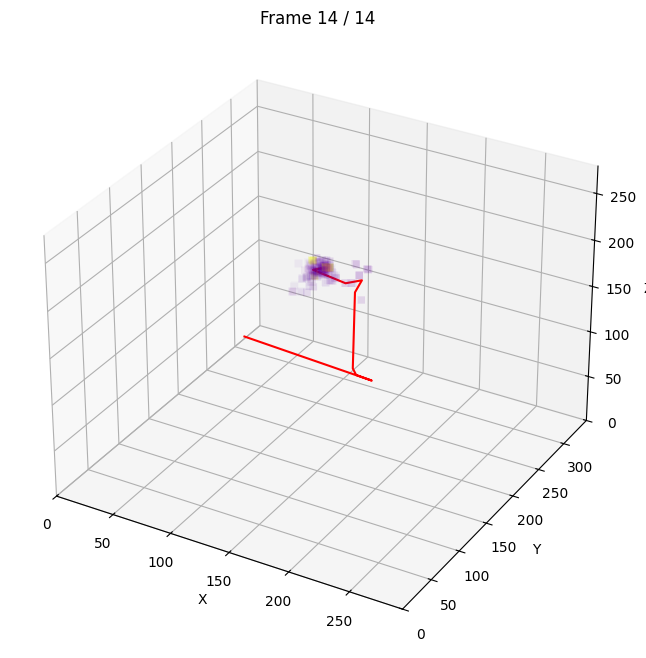

In [ ]:
animate_heatmap_3d(
    heatmaps,
    min_corners,
    paths,
    fps=2,
    output_path = "testing.gif",
)